In [ ]:
path="drive/MyDrive/dog-vision/"

In [ ]:
# !unzip "drive/MyDrive/dog-vision/dog-breed-identification.zip" -d "drive/MyDrive/dog-vision"

In [ ]:
# !pip install tensorflow==2.15.0 keras==2.15.0

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
tf.__version__
print("GPU Available:", tf.config.list_physical_devices('GPU'))

GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
import pandas as pd
labels=pd.read_csv(path+"/labels.csv")
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
import numpy as np
unique_breeds=np.unique(labels["breed"])
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
bool_labels=[label==unique_breeds for label in labels["breed"]]
bool_labels[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
bool_labels=[label.astype(int) for label in bool_labels]
bool_labels[0]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

ok so let's store the image paths in `x` variable and the int labels for each image in `y`.

In [ ]:
filenames=[path+'train/'+id+".jpg" for id in labels["id"]]
filenames[:5]

['drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

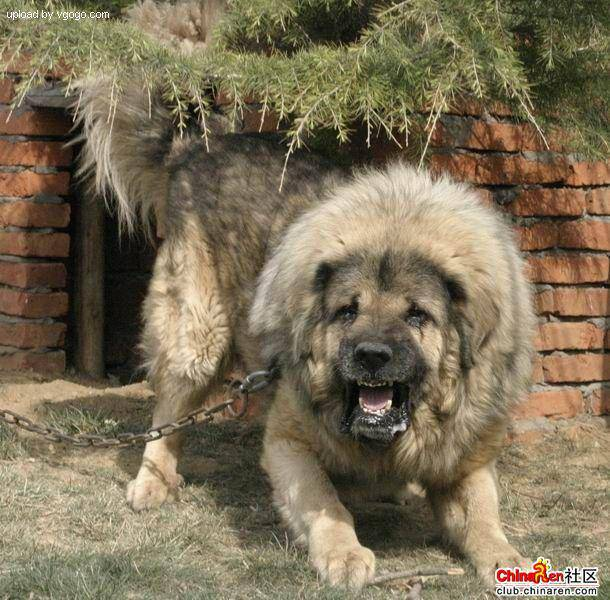

In [ ]:
from IPython.display import Image
Image(filenames[9000])

In [ ]:
labels["breed"][9000]

'tibetan_mastiff'

In [ ]:
x=filenames
y=bool_labels

### setting number of images to use for experimentating.

In [ ]:
# we could also make such sliders in colab exclusively.
NUM_IMAGES=2000 #@param {type:"slider",max:10000,min:1000,step:1000}

### splitting into training and validation set

In [ ]:
from sklearn.model_selection import train_test_split

x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42,
                                             shuffle=True)

<Axes: xlabel='breed'>

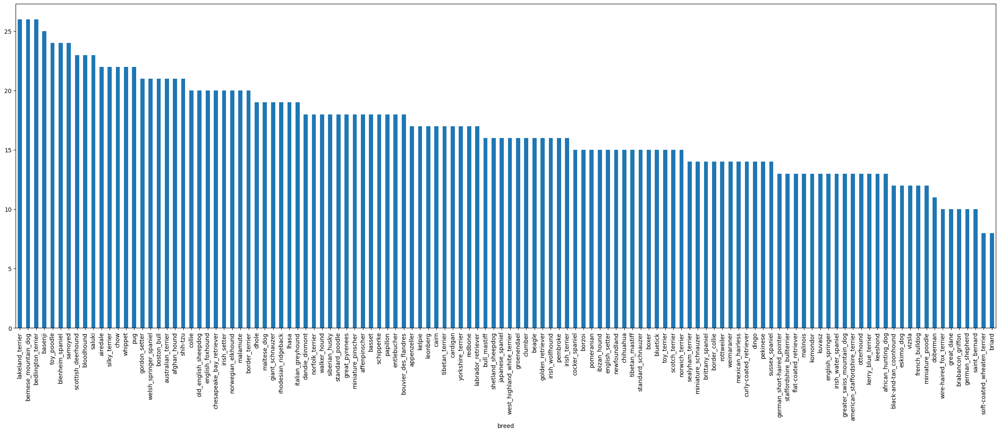

In [ ]:
labels["breed"][:2000].value_counts().plot.bar(figsize=(30,10))

In [ ]:
from matplotlib.pyplot import imread
image=imread(filenames[9000])

In [ ]:
image[:2],image.shape

(array([[[124, 129,  88],
         [150, 155, 114],
         [122, 127,  86],
         ...,
         [ 80,  85,  55],
         [ 66,  73,  40],
         [ 66,  73,  40]],
 
        [[144, 149, 108],
         [153, 158, 117],
         [121, 126,  85],
         ...,
         [ 58,  63,  33],
         [ 65,  72,  41],
         [ 65,  72,  39]]], dtype=uint8),
 (600, 610, 3))

In [ ]:
image=tf.constant(image)
image[:2]

<tf.Tensor: shape=(2, 610, 3), dtype=uint8, numpy=
array([[[124, 129,  88],
        [150, 155, 114],
        [122, 127,  86],
        ...,
        [ 80,  85,  55],
        [ 66,  73,  40],
        [ 66,  73,  40]],

       [[144, 149, 108],
        [153, 158, 117],
        [121, 126,  85],
        ...,
        [ 58,  63,  33],
        [ 65,  72,  41],
        [ 65,  72,  39]]], dtype=uint8)>

Now, let's preprocess the images with the image size and the file path as input so that all images will be of the same size and will be in the form of tensors.

In [ ]:
IMAGE_SIZE=224

In [ ]:
def process_image(filepath,imageSize=IMAGE_SIZE):
  #using tf to store image in a variable
  image=tf.io.read_file(filepath)
  #converting image to tensors
  image=tf.image.decode_jpeg(image,channels=3)
  #normalizing the range from 0-255 to 0-1
  #(it's a property of tf.float32 that all values get normalized to 0-1 when converting to it)
  image=tf.image.convert_image_dtype(image,tf.float32)
  #resizing the image
  image=tf.image.resize(image,[imageSize,imageSize])
  return image

In [ ]:
im=process_image(x[43])
im

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.6932511 , 0.6422707 , 0.50893736],
        [0.7049195 , 0.6539391 , 0.51668423],
        [0.7189601 , 0.66415447, 0.5268996 ],
        ...,
        [0.28510195, 0.23804314, 0.19098432],
        [0.23658979, 0.18953097, 0.14247213],
        [0.17295183, 0.13373615, 0.08667732]],

       [[0.68057597, 0.6295956 , 0.49626228],
        [0.69162816, 0.64064777, 0.50731444],
        [0.706784  , 0.6519783 , 0.51481974],
        ...,
        [0.29755813, 0.2504993 , 0.20344049],
        [0.24967629, 0.20261747, 0.15555863],
        [0.18719192, 0.14797622, 0.1009174 ]],

       [[0.6738776 , 0.6228972 , 0.49740702],
        [0.6841212 , 0.6331408 , 0.5004377 ],
        [0.7016797 , 0.64304876, 0.51417094],
        ...,
        [0.25748226, 0.21042345, 0.16336462],
        [0.23216338, 0.18510455, 0.13804573],
        [0.17874685, 0.13953117, 0.09247234]],

       ...,

       [[0.56411815, 0.5932849 , 0.50466436],
        [0.66

## Creating data batches

Now, we'll be creating data batches of recommended size, 32 image per batch because passing the whole dataset at once might lead to memory overflow.

### Before that, we'll need to make a tuple of `(filepath,label)` that we could pass to our model for training.

In [ ]:
def get_image_label(filepath,label):
  image=process_image(filepath)
  return (image,label)

Now, let's create a function to create batches for training, validation and test data.
1. If we have test data, then we simply form batches after processing image using `process_image` function.
2. If we have validation data then we'll pass it through `get_image_label` function as we also have labels.
3. If we have training data then we'll shuffle it and then pass it through `get_image_label` function.

(according to **yaan lecun**, 32 images is a good batch size)

In [ ]:
BATCH_SIZE=32
def form_batches(x,y=None,batchSize=BATCH_SIZE,validation=False,testing=False):
  """
  this function will take the dataset and
  output the new dataset broken into batches
  after processing the images
  """
  if testing:
    print("Creating test data batches..")
    data=tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch=data.map(process_image).batch(batchSize)
  elif validation:
    print("Creating validation data batches..")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))
    data_batch=data.map(get_image_label).batch(batchSize)
  else:
    print("Creating training data batches..")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))
    # shuffling is done before mapping the images to the labels to decrease the time of shuffling
     ##(as shuffling numbers would obviously take less time than shuffling images.)
    data=data.shuffle(buffer_size=len(x))
    data_batch=data.map(get_image_label).batch(batchSize)
  return data_batch

In [ ]:
train_data=form_batches(x_train,y_train)
valid_data=form_batches(x_val,y_val,validation=True)

Creating training data batches..
Creating validation data batches..


`.element_spec` works the same as `.shape` but in tensorflow.

In [ ]:
train_data.element_spec,valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)))

In `shape=(None, 224, 224, 3)`, "None" indicates that there's a batch size of dynamic nature where all batches might be of size 32 except the last one as the size of dataset that we've taken isn't divisible by 32.

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

Now, let's write a function to view this data that is batches of tightly bound tensors.

In [ ]:
import matplotlib.pyplot as plt
def show_28_images(image,label):
  """
  display 32 images from a batch of images
  """
  plt.figure(figsize=(25,10))
  for i in range(28):
    plt.subplot(4,7,i+1)
    plt.imshow(image[i])
    plt.title(unique_breeds[label[i].argmax()]) ## tensorflow object has no attribute `argmax`, so we'll need to convert it to numpy first when giving input
    plt.axis("off")

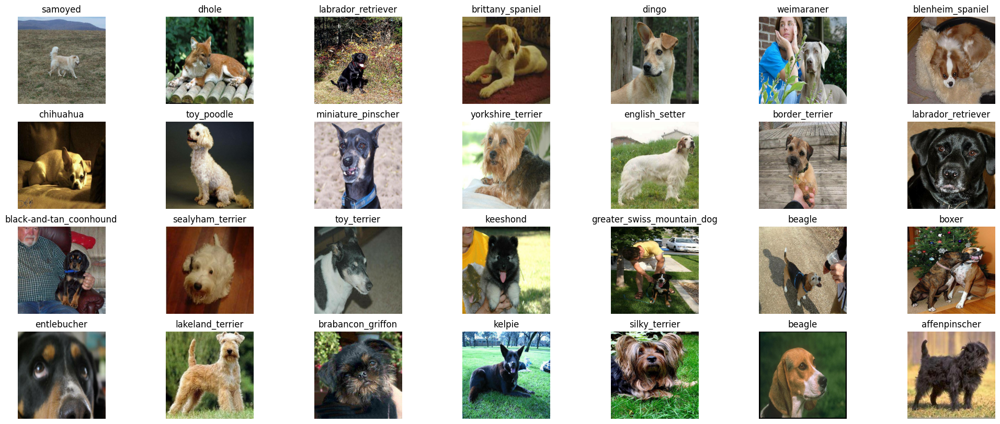

In [ ]:
train_image,train_label=next(train_data.as_numpy_iterator())
show_28_images(train_image,train_label)

Everytime the above cell is run, we get a different set of images shown. This is because we are shuffling the training data every time we're accessing the batch.

But the same isn't true for validation data so we'll have the same images shown no matter how many times we re-run.

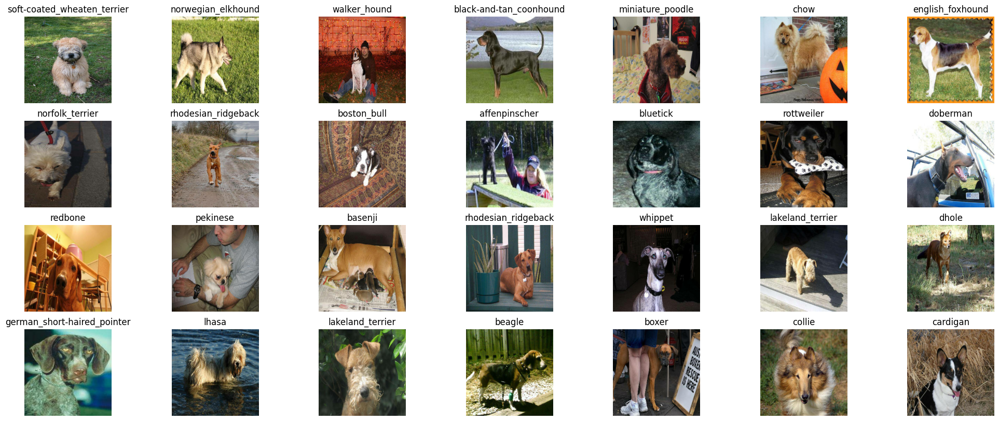

In [ ]:
valid_image,valid_label=next(valid_data.as_numpy_iterator())
show_28_images(valid_image,valid_label)

# After getting our data ready, it's time for modelling
We'll be selecting one from tensorflow hub and we'll be selecting a pre trained model cuz that would generalize better and give better results.

> **Note:** Using a pre-trained model for some other purpose is called *Transfer Learning*.

## How do we choose a model?
For that, we go to tensorflow hub and search for a classification model.

For our purpose, we'll go with [mobilenet_v2](https://www.kaggle.com/code/jonbown/using-kaggle-models-for-image-classification) model.

## How do we build the model?
When using a pre-trained model for transfer learning, we need to specify the input size that the model should expect from us. That's what it means to build.

In [ ]:
INPUT_SIZE=[None,IMAGE_SIZE,IMAGE_SIZE,3]
OUTPUT_SIZE=len(unique_breeds)
MODEL_URL="https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/140-224-classification/2"

Now, let's take input size, output size and model url and make a function to which we'll pass these 3 parameters and which will then return us the model.

In [ ]:
# !pip install tf_keras

In [ ]:
import tf_keras

def make_model(inputSize=INPUT_SIZE,outputSize=OUTPUT_SIZE,modelUrl=MODEL_URL):
  print("Building model with the following parameters:")
  print(f"input size: {inputSize}")
  print(f"output size: {outputSize}")
  print(f"model url: {modelUrl}")

  model=tf_keras.Sequential([
    hub.KerasLayer(modelUrl,trainable=True),
    tf_keras.layers.Dense(units=outputSize,activation="softmax")
  ])

  model.compile(
                loss=tf_keras.losses.CategoricalCrossentropy(), #this needs to be decreased
                optimizer=tf_keras.optimizers.Adam(), #this helps in decreasing loss
                metrics=["accuracy"])

  model.build(inputSize)

  return model

In [ ]:
model=make_model()

Building model with the following parameters:
input size: [None, 224, 224, 3]
output size: 120
model url: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/140-224-classification/2


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


## Creating Callbacks
Now, we need to create early stopping callback and tensorboard callback to stop the training process early if no improvement is happening and to track the progress of the model everytime that it trains respectively.

They're very useful for big models that take a lot of time to train.

### Tensorboard
1. Create tensorboard extension to use it in the notebook.
2. Create a callback to pass to the model during `fit()` process
3. Analyze the logs recorded by tensorboard using `%tensorboard` magic function.

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime
import os

def tensorboard_callback():
  logdir=os.path.join("drive/MyDrive/dog-vision/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

### Early stopping callback

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", # judged on the basis of val accuracy
                                                patience=3) # training will stop if there's no improvement for continuously 3 epochs

In [ ]:
# we first need to define the number of epochs before we fit the model to our data
NUM_EPOCHS=100 #@param {type:"slider",max:100,min:10,step:10}

In [ ]:
# now let's write a function to fit the model along with the callbacks

def train_model(train_data,validation=False):
  # making a model
  model=make_model()

  # creating tensorboard callback
  tensorboard=tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data if validation else None,
            validation_freq=1 if validation else None, # ensures that validation accuracy is printed after every epoch
            callbacks=[tensorboard,early_stopping])

  return model

In [ ]:
# fitting the model
model_2000=train_model(train_data=train_data,validation=True)

NameError: name 'train_data' is not defined

In [ ]:
%tensorboard --logdir drive/MyDrive/dog-vision/logs

<IPython.core.display.Javascript object>

In [ ]:
predictions=model_2000.predict(valid_data,verbose=1) # even if we pass the labels along with the images in a batch, it'll by itself drop the labels and predict solely based on images

13/13 [==============================] - 58s 4s/step


In [ ]:
unique_breeds[np.argmax(predictions[1])]

'norwegian_elkhound'

In [ ]:
unique_breeds[np.argmax(y_val[1])]

'norwegian_elkhound'

In [ ]:
np.sum(predictions[1]), np.sum(predictions[3])

(1.0, 0.99999994)

In [ ]:
model_2000.save(path+"models/model_small.h5")

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model_2000.evaluate(valid_data)

13/13 [==============================] - 13s 951ms/step - loss: 0.8875 - accuracy: 0.7575


[0.8874964714050293, 0.7574999928474426]

In [ ]:
model_2000=tf.keras.models.load_model(path+"models/model_small.h5",
                                      custom_objects={"KerasLayer":hub.KerasLayer},)
model_2000.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              3540265   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 3660505 (13.96 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 3540265 (13.51 MB)
_________________________________________________________________


### Now, we create functions to get and visualize the predictions that our model is making.

In [ ]:
def get_pred_label(prediction):
  return unique_breeds[np.argmax(prediction)]

# pred_label=get_pred_label(predictions[2])
# pred_label

In [ ]:
# function to unbatchify data
def unbatchify(data):
  """
  This function will unbatchify the batched data.
  """
  images=[]
  labels=[]

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(get_pred_label(label))
  return images,labels

# val_images,val_labels=unbatchify(valid_data)
# val_images[0],val_labels[0]

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_prob,image,true_label=prediction_probabilities[n],images[n],labels[n]
  pred_label=get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label==true_label:
    color='green'
  else:
    color='red'

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
            color=color)

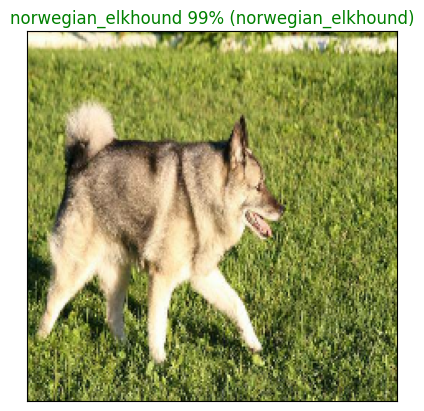

In [ ]:
plot_pred(predictions,val_labels,val_images)

Now, we'll also be making a graph with top 10 confidence values to better understand the model's predictions and compare with the actual label.

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  For a sample, n, this functions plots the top 10
  confidence values along with the true label.
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  pred_label=get_pred_label(pred_prob)

  top_10_pred_indexes=np.argsort(pred_prob)[-10:][::-1]
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]
  top_10_pred_prob=pred_prob[top_10_pred_indexes]

  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_prob,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(true_label==top_10_pred_labels)].set_color("green")


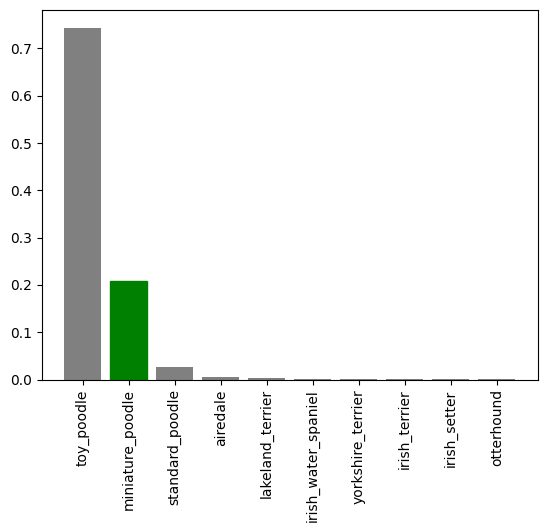

In [ ]:
plot_pred_conf(predictions,val_labels,n=4)

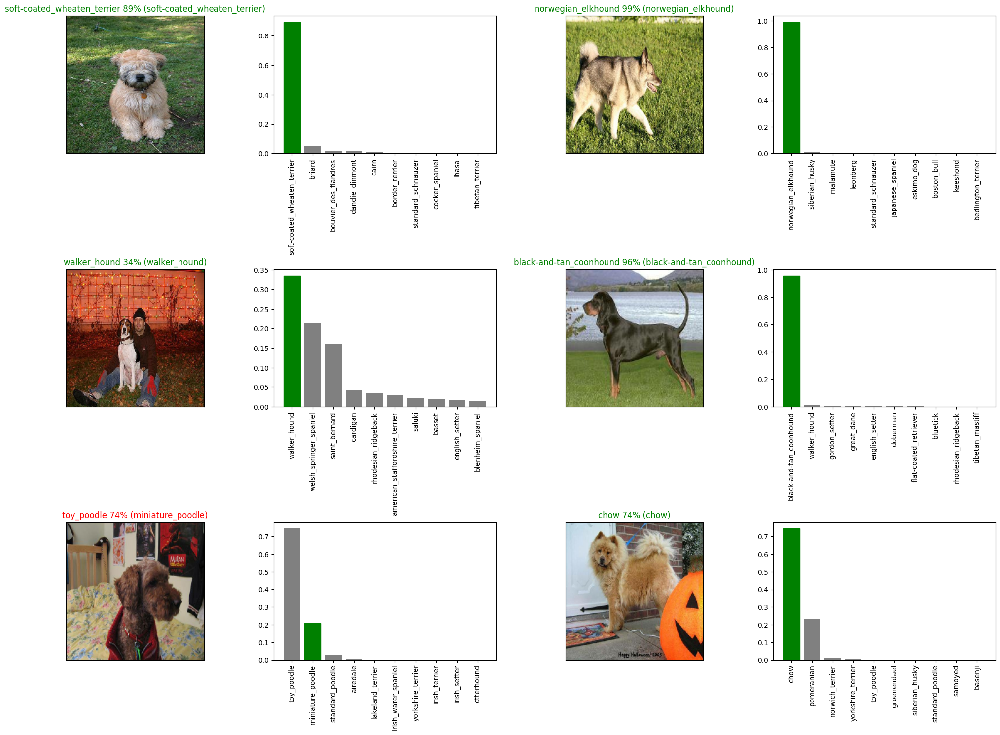

In [ ]:
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(5*2*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Next, we'll be training the model on the whole data without any splitting

In [ ]:
full_train_data=form_batches(x,y)
full_train_data.element_spec

Creating training data batches..


(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                patience=3)

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
full_model=train_model(train_data=full_train_data)

Building model with the following parameters:
input size: [None, 224, 224, 3]
output size: 120
model url: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/140-224-classification/2


AttributeError: 'TensorBoard' object has no attribute '_implements_train_batch_hooks'

In [ ]:
full_model=make_model()
full_model_tensorboard=tensorboard_callback()
full_model_early_stopping=tf_keras.callbacks.EarlyStopping(monitor='accuracy',
                                                           patience=3)
full_model.fit(x=full_train_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Building model with the following parameters:
input size: [None, 224, 224, 3]
output size: 120
model url: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/140-224-classification/2
Epoch 1/100
146/320 [============>.................] - ETA: 21:30 - loss: 3.9234 - accuracy: 0.1550

In [ ]:
full_model.save(path+"models/model_full.h5")